In [1]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
%matplotlib inline
from fbprophet import Prophet

import seaborn as sns

import plotly
import chart_studio.plotly as py
#import cufflinks as cf
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.offline as offline
offline.init_notebook_mode()

import warnings
warnings.filterwarnings("ignore")

C:\Users\Hitesh\AppData\Local\Continuum\anaconda3\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
import pandas as pd
import glob

path = r'C:/Users/Hitesh/Desktop/LJMU/Forex Implementation/USD JPY/Data/' 
all_files = glob.glob(path + "/*.csv")

li = []

for filename in all_files:
    df = pd.read_csv(filename, index_col=None, header=0)
    df.columns = ['Index','ds','Open_Bid_Quote','High_Bid_Quote','Low_Bid_Quote','y','Volume']
    df.drop(columns=['Index','Volume','Open_Bid_Quote','High_Bid_Quote','Low_Bid_Quote'],inplace=True)
    li.append(df)

data = pd.concat(li, axis=0, ignore_index=True)

In [3]:
data.head()

,ds,y
0,2010-01-03 17:01:00,92.96
1,2010-01-03 17:02:00,92.99
2,2010-01-03 17:03:00,92.99
3,2010-01-03 17:04:00,92.99
4,2010-01-03 17:05:00,93.01


In [4]:
from datetime import datetime                                              
data['ds'] = pd.to_datetime(data['ds'])
#data = data.set_index('ds')

In [5]:
data = data.resample('H', on='ds').max()
data = data.rename_axis("Index")
data.head()

,ds,y
Index,,
2010-01-03 17:00:00,2010-01-03 17:59:00,93.08
2010-01-03 18:00:00,2010-01-03 18:59:00,93.00
2010-01-03 19:00:00,2010-01-03 19:59:00,92.95
2010-01-03 20:00:00,2010-01-03 20:59:00,93.06
2010-01-03 21:00:00,2010-01-03 21:59:00,92.96


In [6]:
data=data.dropna(subset=['ds', 'y'])

In [7]:
data['y'].isnull().sum()/len(data)*100

0.0

In [8]:
print(len(data))
print(int(len(data)*20/100))

71488
14297


In [9]:
# create test dataset, remove last 12 months
train = data.drop(data.index[-(int(len(data)*20/100)):])
print(train.tail())

                                     ds        y
Index                                           
2019-03-13 15:00:00 2019-03-13 15:59:00  111.205
2019-03-13 16:00:00 2019-03-13 16:59:00  111.275
2019-03-13 17:00:00 2019-03-13 17:59:00  111.302
2019-03-13 18:00:00 2019-03-13 18:59:00  111.240
2019-03-13 19:00:00 2019-03-13 19:59:00  111.249


In [10]:
# create test dataset, remove last 12 months
test = data.drop(data.index[:-(int(len(data)*20/100))])
print(test.tail())

                                     ds        y
Index                                           
2021-06-30 19:00:00 2021-06-30 19:59:00  111.137
2021-06-30 20:00:00 2021-06-30 20:59:00  111.159
2021-06-30 21:00:00 2021-06-30 21:59:00  111.071
2021-06-30 22:00:00 2021-06-30 22:59:00  111.070
2021-06-30 23:00:00 2021-06-30 23:58:00  111.105


In [11]:
print(len(train))
print(len(test))

57191
14297


In [12]:
print(train['ds'].max())
print(train['ds'].min())
print(test['ds'].max())
print(test['ds'].min())

2019-03-13 19:59:00
2010-01-03 17:59:00
2021-06-30 23:58:00
2019-03-13 20:59:00


In [13]:
# define the model
model = Prophet()
# fit the model
model.fit(train)

In [14]:
model

In [15]:
future=pd.date_range(test['ds'].min(),test['ds'].max(),freq='min')
len(future)

1209780

In [16]:
future

DatetimeIndex(['2019-03-13 20:59:00', '2019-03-13 21:00:00',
               '2019-03-13 21:01:00', '2019-03-13 21:02:00',
               '2019-03-13 21:03:00', '2019-03-13 21:04:00',
               '2019-03-13 21:05:00', '2019-03-13 21:06:00',
               '2019-03-13 21:07:00', '2019-03-13 21:08:00',
               ...
               '2021-06-30 23:49:00', '2021-06-30 23:50:00',
               '2021-06-30 23:51:00', '2021-06-30 23:52:00',
               '2021-06-30 23:53:00', '2021-06-30 23:54:00',
               '2021-06-30 23:55:00', '2021-06-30 23:56:00',
               '2021-06-30 23:57:00', '2021-06-30 23:58:00'],
              dtype='datetime64[ns]', length=1209780, freq='T')

In [17]:
from pandas import DataFrame
future = DataFrame(future)
future.columns = ['ds']
future.head()

,ds
0,2019-03-13 20:59:00
1,2019-03-13 21:00:00
2,2019-03-13 21:01:00
3,2019-03-13 21:02:00
4,2019-03-13 21:03:00


In [18]:
future = pd.merge(test, future, on=['ds'], how='inner')
future.head()

,ds,y
0,2019-03-13 20:59:00,111.492
1,2019-03-13 21:59:00,111.465
2,2019-03-13 22:59:00,111.612
3,2019-03-13 23:59:00,111.609
4,2019-03-14 00:59:00,111.595


In [19]:
len(future)

14297

In [20]:
print(future['ds'].min())
print(future['ds'].max())

2019-03-13 20:59:00
2021-06-30 23:58:00


In [21]:
future['ds'] = pd.to_datetime(future['ds'])
len(future)

14297

In [22]:
# use the model to make a forecast
forecast = model.predict(future)

In [23]:
# calculate MAE between expected and predicted values for december
y_true = test['y'][-(len(future)):].values
y_pred = forecast['yhat'].values

In [24]:
y_true

array([111.492, 111.465, 111.612, ..., 111.071, 111.07 , 111.105])

In [25]:
y_pred

array([108.99112756, 108.9842046 , 108.96491267, ..., 110.25081361,
       110.23436974, 110.21986977])

In [26]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, classification_report, explained_variance_score
from sklearn import metrics
from math import sqrt

In [27]:
mae = mean_absolute_error(y_true, y_pred)
print('MAE: %.3f' % mae)

MAE: 3.182


In [28]:
from sklearn.metrics import mean_squared_error

rms = sqrt(mean_squared_error(y_true, y_pred))
rms

3.900812853170361

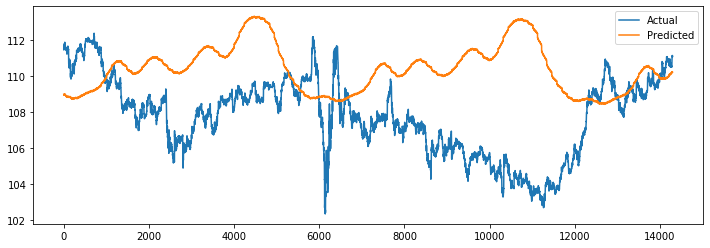

In [29]:
# plot expected vs actual
plt.figure(figsize=(12,4))
plt.plot(y_true, label='Actual')
plt.plot(y_pred, label='Predicted')
plt.legend()
plt.show()

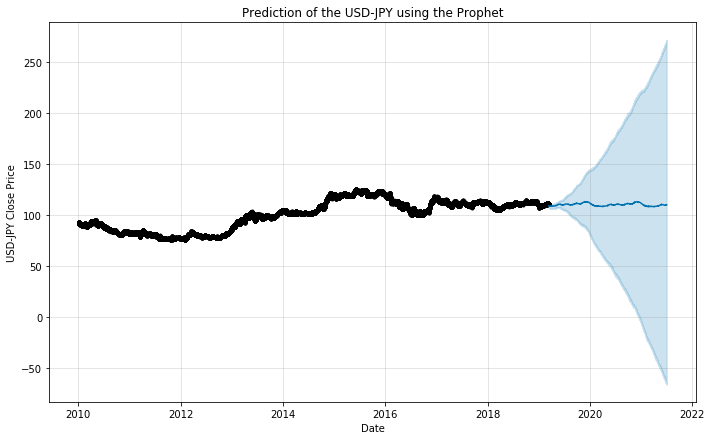

In [30]:
model.plot(forecast)
plt.title("Prediction of the USD-JPY using the Prophet")
plt.xlabel("Date")
plt.ylabel("USD-JPY Close Price")
plt.show()

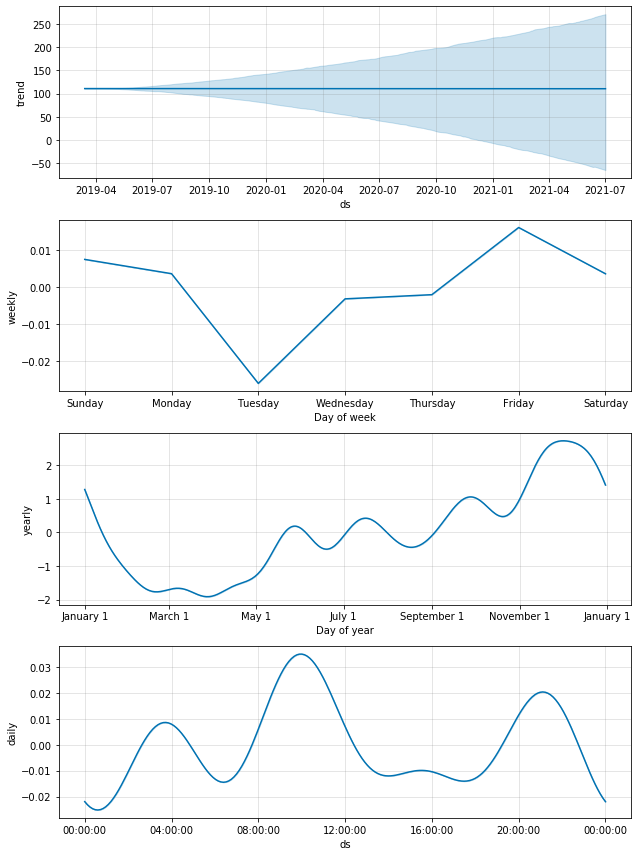

In [31]:
model.plot_components(forecast)
plt.show()

In [32]:
trace_open = go.Scatter(
    x = forecast["ds"],
    y = forecast["yhat"],
    mode = 'lines',
    name="Forecast"
)

trace_high = go.Scatter(
    x = forecast["ds"],
    y = forecast["yhat_upper"],
    mode = 'lines',
    fill = "tonexty", 
    line = {"color": "#57b8ff"}, 
    name="Higher uncertainty interval"
)

trace_low = go.Scatter(
    x = forecast["ds"],
    y = forecast["yhat_lower"],
    mode = 'lines',
    fill = "tonexty", 
    line = {"color": "#57b8ff"}, 
    name="Lower uncertainty interval"
)

trace_close = go.Scatter(
    x = data["ds"],
    y = data["y"],
    name="Data values"
)



data = [trace_open,trace_high,trace_low,trace_close]

layout = go.Layout(title="USD-JPY Forecast",xaxis_rangeslider_visible=True)

fig = go.Figure(data=data,layout=layout)

plotly.offline.iplot(fig)

In [33]:
test[test.index.min():].head()

,ds,y
Index,,
2019-03-13 20:00:00,2019-03-13 20:59:00,111.492
2019-03-13 21:00:00,2019-03-13 21:59:00,111.465
2019-03-13 22:00:00,2019-03-13 22:59:00,111.612
2019-03-13 23:00:00,2019-03-13 23:59:00,111.609
2019-03-14 00:00:00,2019-03-14 00:59:00,111.595


In [34]:
forecast['yhat'].head()

0    108.991128
1    108.984205
2    108.964913
3    108.947416
4    108.944935
Name: yhat, dtype: float64

In [35]:
forecast.columns

Index(['ds', 'trend', 'yhat_lower', 'yhat_upper', 'trend_lower', 'trend_upper',
       'additive_terms', 'additive_terms_lower', 'additive_terms_upper',
       'daily', 'daily_lower', 'daily_upper', 'weekly', 'weekly_lower',
       'weekly_upper', 'yearly', 'yearly_lower', 'yearly_upper',
       'multiplicative_terms', 'multiplicative_terms_lower',
       'multiplicative_terms_upper', 'yhat'],
      dtype='object')

In [36]:
forecast['ds'].head()

0   2019-03-13 20:59:00
1   2019-03-13 21:59:00
2   2019-03-13 22:59:00
3   2019-03-13 23:59:00
4   2019-03-14 00:59:00
Name: ds, dtype: datetime64[ns]

In [37]:
forecast['ds'] = pd.to_datetime(forecast['ds'])

In [38]:
forecast = forecast.set_index('ds')
forecast.head()

,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,daily_lower,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
ds,,,,,,,,,,,,,,,,,,,,,
2019-03-13 20:59:00,110.684773,107.115548,110.813817,110.684773,110.684773,-1.693645,-1.693645,-1.693645,0.020248,0.020248,...,-0.002279,-0.002279,-0.002279,-1.711614,-1.711614,-1.711614,0.0,0.0,0.0,108.991128
2019-03-13 21:59:00,110.684756,106.959815,110.722650,110.684756,110.684756,-1.700552,-1.700552,-1.700552,0.013942,0.013942,...,-0.002251,-0.002251,-0.002251,-1.712243,-1.712243,-1.712243,0.0,0.0,0.0,108.984205
2019-03-13 22:59:00,110.684740,107.161324,110.776425,110.684740,110.684740,-1.719827,-1.719827,-1.719827,-0.004792,-0.004792,...,-0.002159,-0.002159,-0.002159,-1.712875,-1.712875,-1.712875,0.0,0.0,0.0,108.964913
2019-03-13 23:59:00,110.684723,107.292074,110.852947,110.684723,110.684723,-1.737307,-1.737307,-1.737307,-0.021797,-0.021797,...,-0.001999,-0.001999,-0.001999,-1.713510,-1.713510,-1.713510,0.0,0.0,0.0,108.947416
2019-03-14 00:59:00,110.684706,107.083070,110.740693,110.684706,110.684706,-1.739771,-1.739771,-1.739771,-0.023857,-0.023857,...,-0.001767,-0.001767,-0.001767,-1.714148,-1.714148,-1.714148,0.0,0.0,0.0,108.944935


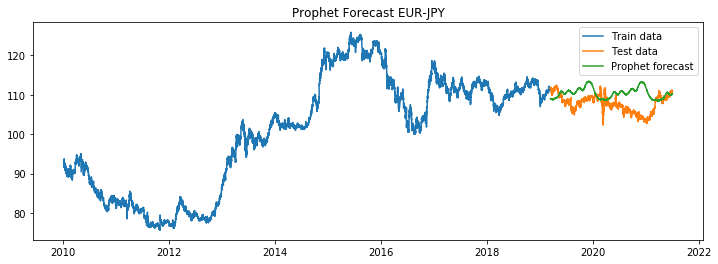

In [39]:
plt.figure(figsize=(12,4))
plt.plot(train['y'], label='Train data')
plt.plot(test['y'], label='Test data')
plt.plot(forecast['yhat'][test.index.min():], label='Prophet forecast')
plt.legend(loc='best')
plt.title('Prophet Forecast EUR-JPY')
plt.show()